# 바다를 배경으로 boat를 넣을 것 

우선 아래에 boat만 가지고 있는 이미지들의 label이 저장되어 있는  json파일을 가져옴

242.93394955899794,60.553629038952295,0.0,49.04017171462374,2.3241787540978294,0.0,245.25812831309577,11.513457324328556


In [19]:


file_list = os.listdir("Boat2")
max_len = len(file_list)


In [276]:
import numpy as np
boat_idx = random.randrange(0,max_len)


boat_num = random.randrange(0,max_len)
posX = random.randrange(0,2700)
posY = random.randrange(0,2700)
print(boat_num)
print(posX)
print(posY)


0
374
877


아래는 원래 데이터셋에 있는 분포와 최대한 유사하도록 배들의 분포를 가져옴


In [297]:
image_dict = {}
with open('labels.json') as json_file:
    json_data = json.load(json_file)
    for data in json_data["features"]:
        image_id = data["properties"]["image_id"]
        type_id = data["properties"]["type_id"]
        try:
            image_dict[image_id]["type_id"].append(type_id)
        except:
            image_dict[image_id] = {}
            image_dict[image_id]["type_id"] = []
            image_dict[image_id]["type_id"].append(type_id)

In [298]:
random_boat_num = []

S = [0 for i in range(200)]

for key in image_dict.keys():
    n = len(image_dict[key]['type_id'])
    S[n] += 1
for i in range(200):
    for j in range(S[i]):
        random_boat_num.append(i)
random_boat_num[-25]


40

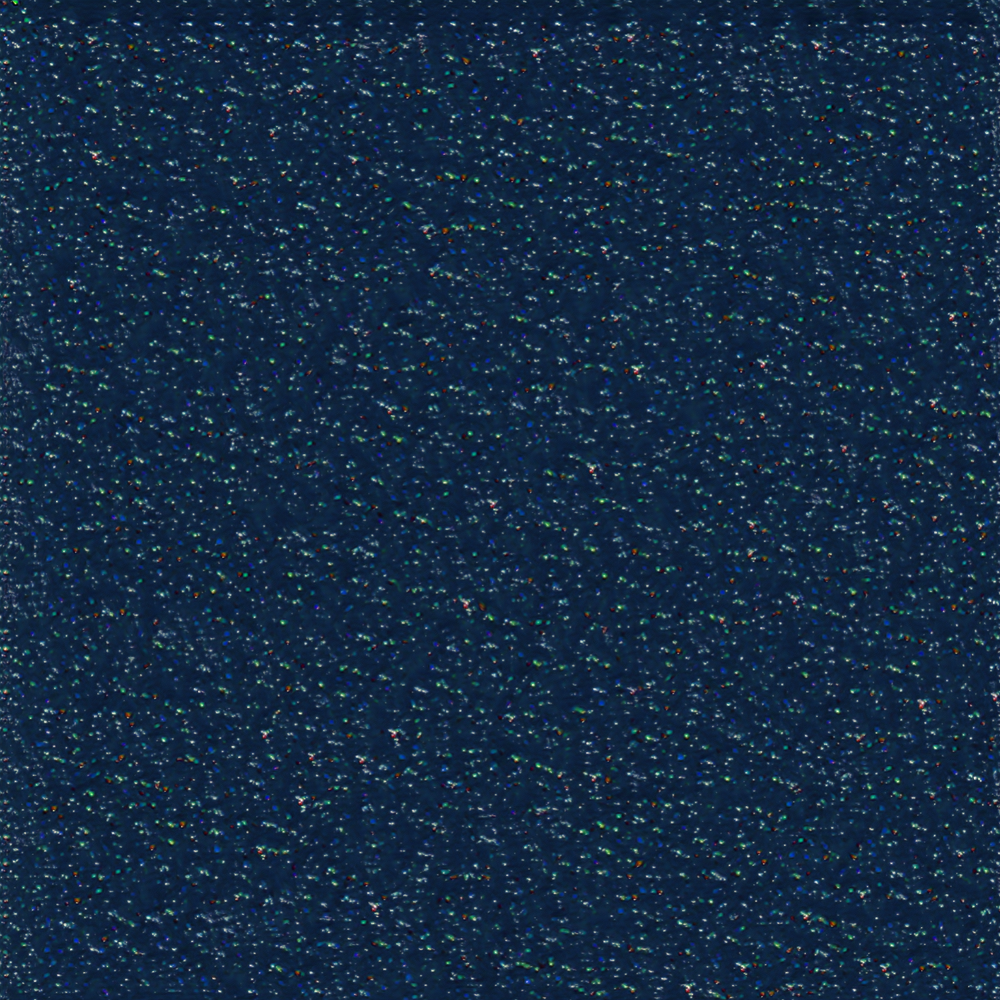

In [294]:
from PIL import Image, ImageDraw
sea_dir = "./../SinGAN/Output/RandomSamples_ArbitrerySizes/"
file_list = ['sea', 'sea2', 'sea3', 'sea4', 'sea5', 'sea6', 'sea7', 'sea8', 'sea9']
sea_type = random.randrange(0,9)
sea_idx = random.randrange(0,50)

image_path = "./../SinGAN/Output/RandomSamples_ArbitrerySizes/"
image_path += file_list[sea_type]
image_path += "/scale_v=6.000000_scale_h=6.000000/"
image_path +=  (str(sea_idx) + ".png")

im = Image.open(image_path).convert("RGBA")
im




In [340]:
boat_dict = {}
with open("boat_labels.json") as json_file:
    json_data = json.load(json_file)
    for data in json_data:
        boat_dict[data] = json_data[data]
print(boat_dict["4_1701.png"])

125.07854257374512,155.96183784598725,0.0,33.544540850043404,32.83082721731601,0.0,157.90936979106112,122.41729699594384


In [377]:
from shapely.geometry import Polygon
from tqdm import tqdm

boat_path = "Boat2/"
file_list = ['sea', 'sea2', 'sea3', 'sea4', 'sea5', 'sea6', 'sea7', 'sea8', 'sea9']
boats_name = os.listdir(boat_path)
boat_length = len(boats_name)
labeling_dict = {}

for Gnum in range(5):
    boat_num = random.randrange(0,len(random_boat_num))
    boat_num = random_boat_num[boat_num]

    sea_type = random.randrange(0,9)
    sea_idx = random.randrange(0,50)

    sea_dir = "./../SinGAN/Output/RandomSamples_ArbitrerySizes/"
    sea_dir += file_list[sea_type]
    sea_dir += "/scale_v=6.000000_scale_h=6.000000/"
    sea_dir +=  (str(sea_idx) + ".png")

    sea_im = Image.open(sea_dir).convert("RGBA")
    polygons = []
    class_ids = []
    bounding_boxs = []
    for i in range(boat_num):
        boat_idx = random.randrange(0, boat_length)
        boat_im = Image.open(boat_path + boats_name[boat_idx])
        posX = random.randrange(0,1350)
        posY = random.randrange(0,1350)
        bounding_box = list(map(float, boat_dict[boats_name[boat_idx]].split(',')))
        for i in range(0,8,2):
            bounding_box[i] += posX
            bounding_box[i+1] += posY
        temp_polygon = Polygon([(bounding_box[0],bounding_box[1]), (bounding_box[2],bounding_box[3]),
                        (bounding_box[4],bounding_box[5]), (bounding_box[6],bounding_box[7])])
        is_continue = False
        for P in polygons:
            IOU = temp_polygon.intersection(P).area/temp_polygon.union(P).area
            if IOU > 0.1:
                is_continue = True
                break
        if not is_continue:
            polygons.append(temp_polygon)
            sea_im.paste(boat_im,(posX, posY), boat_im)
            class_ids.append(int(boats_name[boat_idx].split('_')[0]))
            bounding_boxs.append(bounding_box)


    save_im_name = str(Gnum) + '.png'
    labeling_dict[save_im_name] = {}
    labeling_dict[save_im_name]["class_id"] = class_ids
    labeling_dict[save_im_name]["bounding_box"] = bounding_boxs
    sea_im.save("GeneratingImages/" + save_im_name)

with open("generating_labels.json", "w") as json_file:
    json.dump(labeling_dict, json_file)


In [14]:
import json
Gdata = {}
with open("generating_labels.json") as json_file:
    json_data = json.load(json_file)
    for data in json_data:
        Gdata[data] = json_data[data]



2

[450.0, 1106.8532756206373, 484.32650603681213, 1050.0, 505.5414603443721, 1062.8090290165233, 471.21495430756, 1119.6623046371606]
[1618.970140350952, 1187.9138009243698, 1042.0, 1066.2258176125974, 1055.3348707332325, 1003.0, 1632.3050110841846, 1124.6879833117723]
[810.0, 987.2350084625223, 950.6701456128153, 983.0, 951.4579830690473, 1009.1688283903409, 810.787837456232, 1013.4038368528632]
[763.8952169053414, 1104.079090975697, 682.0, 1082.1598166441572, 687.6634299700859, 1061.0, 769.5586468754273, 1082.9192743315398]


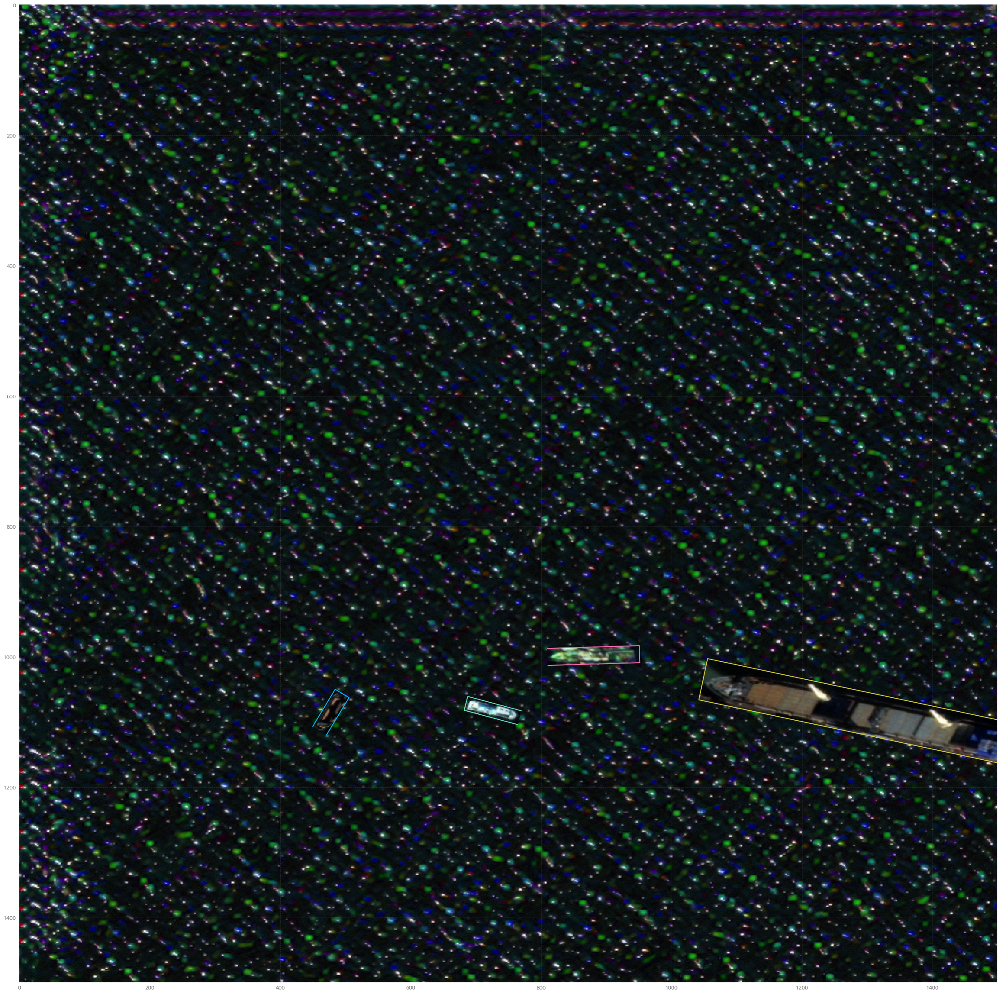

In [15]:
from matplotlib import pyplot as plt
from matplotlib.image import imread
img = imread("GeneratingImages/1.png")
plt.figure(figsize=(40, 40))
for i in range(len(Gdata['1.png']['bounding_box'])):
    point = Gdata['1.png']['bounding_box'][i]
    print(point)
    pointA = [point[j] for j in range(0,8,2)]
    pointB = [point[j] for j in range(1,8,2)]
    plt.plot(pointA, pointB)

plt.imshow(img)
plt.show()